<a href="https://colab.research.google.com/github/Nattyb21/diss/blob/main/finalstartynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [61]:
%pip install mplsoccer

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [62]:
import numpy as np
import random
from mplsoccer import Pitch
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML
import math
import ast

import time
import csv

from matplotlib.lines import Line2D

Ideas to implement:


Passing Mechanics:

    - Add more pass types
    - Passes affected by playstyle (e.g. direct more likely to long pass to striker)
    - More realistic passes (less random and say they build up are likely to pass around the back more and make less forward passes)
    - Passes going to a player rather than random x amount of places (unless like a throughball)


Positional Mechanics:

    - Passes based off where players (going to pass to closer players)
    - Players move as the game goes on (e.g. player moves up pitch with ball, team will follow)


Bayesian Model:

    - Implement the Bayesian Model
    
Real Data:

    - Implement the real data
    - Alter team strength algorithm
    - Add more playstyles
    - Add more formations


Misc:

    - Visualise the data

In [63]:
team_strength = {
    "home": {"attacking": 8.9, "defensive": 7.8, "possession": 8.2},
    "away": {"attacking": 7.2, "defensive": 6.5, "possession": 6.5}
}


# GameState

In [64]:
class GameState:
  """
  The current state of the simulation
  This class handles the game logic, ball and player movement as well
  possession
  """

  pitch_width = 120
  pitch_height = 80

  def __init__(self):  # Replace all variables later with database
    """ Initialise the game state variables """

    self.time = 0
    self.scoreline = {"home":0,"away":0}
    self.possession = "home"
    self.team_style, self.team_approach, self.formation = self.team_setup()
    self.ball_x = 60  #120 long
    self.ball_y = 40  #80 wide
    self.team_strength = team_strength
    self.ball_location = "mid"  # will remove soon
    self.player_pos = self.initialise_formation()
    self.players = self.initialise_player()
    self.shot_data = []
    self.pass_data = []
    self.event_data = []
    self.store_starting_formation = []
    self.original_positions = self.initialise_formation()

  def store_starting_formation(self):
    self.starting_positions = self.initialise_formation()

  def team_setup(self):    #Later will come from real data
     team_style = {"home": "long ball", "away": "counter attack"}
     team_approach = {"home": "balanced", "away": "attacking"}
     formation = {"home": "4-3-3", "away": "4-3-3"}  # Can be expanded later
     return team_style, team_approach, formation

  def change_playstyle(self, team, new_playstyle = None, new_formation = None):

    if new_playstyle:
      if new_playstyle in ["long ball", "possession", "counter attack"]:
        self.team_style[team] = new_playstyle
      else:
        print(f"Invalid playstyle, Options available: long ball, possession, counter attack")

    if new_formation:
      if new_formation in ["4-3-3", "4-4-2", "3-4-3", "5-3-2", "4-2-3-1"]:
        self.formation[team] = new_formation
        self.adjust_new_positions (team, new_formation)
      else:
        print("Invalid formation, Options available: 4-3-3, 4-4-2, 3-4-3, 5-3-2, 4-2-3-1")

  def initialise_formation(self):
    #4-3-3 example for now
    return {
        "home" : {
             "GK": (5, 40),
             "LCB": (20, 30), "RCB": (20, 50), "LB": (15, 15), "RB": (15, 65),
             "LCM": (40, 30), "RCM": (40, 50), "CDM": (35, 40),
             "LW": (70, 15), "ST": (80, 40), "RW": (70, 65)
            },
            "away": {
                "GK": (115, 40),
                "LCB": (100, 30), "RCB": (100, 50), "LB": (105, 15), "RB": (105, 65),
                "LCM": (80, 30), "RCM": (80, 50), "CDM": (85, 40),
                "LW": (50, 15), "ST": (40, 40), "RW": (50, 65)
            }
        }


  def initialise_player(self):
    players = {"home": {}, "away": {}}

    for team in ["home", "away"]:
      for role, position in self.player_pos[team].items():
        x = position[0]
        if team == "away":
          x = 120 - x
        player =  PlayerMechanicsBayesian(role, position[0], position[1], role, team)
        players[team][role] = player
    return players


  def get_player_pos(self):
    positions = {"home":{},"away":{}}

    for team in ["home", "away"]:
      for role, player in self.players[team].items():
        positions[team][role] = (player.x_pos, player.y_pos)
    return positions
  '''
  def debug_pos_change(self):
    """Track position changes for debugging"""
    if not hasattr(self, 'position_tracking'):
        self.position_tracking = {team: {role: [] for role in self.players[team]} 
                                for team in ['home', 'away']}
    
    for team in ['home', 'away']:
        for role, player in self.players[team].items():
            self.position_tracking[team][role].append({
                'time': self.time,
                'x': player.x_pos,
                'y': player.y_pos,
                'distance_from_base': player.return_to_formation_weight()
            })
            
            # Keep last 100 positions only
            if len(self.position_tracking[team][role]) > 100:
                self.position_tracking[team][role].pop(0)
  '''
  def get_nearest_player(self, team, x, y):
    nearest_player = None
    min_distance = float('inf')

    for role, player in self.players[team].items():
      ply_x, ply_y = player.get_position()
      distance = np.sqrt((x - ply_x)**2 + (y - ply_y)**2)

      if distance < min_distance:
        min_distance = distance
        nearest_player = role
    return nearest_player

  def update_ball_location(self):
    if self.ball_x < self.pitch_width / 3:
            self.ball_location = "def_third"
    elif self.ball_x < 2 * self.pitch_width / 3:
            self.ball_location = "mid"
    else:
            self.ball_location = "off_third"

  def lose_possession(self):
    print(f"Before possession loss: Team in possession = {self.possession}, Ball at x = {self.ball_x}")

    if self.possession == "home":
      self.possession = "away"
      #print("Home team lost the ball")
    else:
      self.possession = "home"
     # print("Away team lost the ball")

 #   print(f"After possession loss: Team in possession = {self.possession}, Ball at x = {self.ball_x}")


  def restart_ball(self):
    if self.possession == "home":
      self.possession = "away"
    else:
      self.possession = "home"

    self.ball_x = 60
    self.ball_y = 40
    print(f"Ball restarted, x:{self.ball_x}, y: {self.ball_y}")


  def player_movement(self):
    self.update_ball_location()
    for team in ["home", "away"]:
            for role, player in self.players[team].items():
                player.update_pos(self)
    #self.debug_pos_change()




  def adjust_new_positions(self, team, new_formation):
    formation_positions = {
            "4-3-3": {"GK": (5, 40), "LCB": (20, 30), "RCB": (20, 50), "LB": (15, 15), "RB": (15, 65),
                       "LCM": (40, 30), "RCM": (40, 50), "CDM": (35, 40), "LW": (70, 15), "ST": (80, 40), "RW": (70, 65)},
            "4-4-2": {"GK": (5, 40), "LCB": (20, 30), "RCB": (20, 50), "LB": (15, 15), "RB": (15, 65),
                       "LM": (50, 15), "CM1": (40, 30), "CM2": (40, 50), "RM": (50, 65), "ST1": (80, 35), "ST2": (80, 45)},
            "3-5-2": {"GK": (5, 40), "CB1": (25, 20), "CB2": (25, 40), "CB3": (25, 60), "LWB": (50, 10), "RWB": (50, 70),
                       "CM1": (40, 30), "CM2": (40, 50), "CDM": (35, 40), "ST1": (80, 35), "ST2": (80, 45)},
            "5-3-2": {"GK": (5, 40), "LCB": (15, 25), "CB": (15, 40), "RCB": (15, 55), "LB": (10, 10), "RB": (10, 70),
                       "CM1": (40, 30), "CM2": (40, 50), "CDM": (35, 40), "ST1": (80, 35), "ST2": (80, 45)}
        }
    if new_formation in formation_positions:
            self.formation[team] = new_formation
            for role, position in formation_positions[new_formation].items():
              x, y = position
              if team == "away":
                  x = 120 - x
              self.players[team][role].x_pos = x
              self.players[team][role].y_pos = y
              self.players[team][role].set_movement_zones()

    else:
      raise ValueError(f"Invalid formation: {new_formation}")
    
  
  def debug_pos_change(self, player, old_pos, new_pos, method_name):
    if not hasattr(self, 'position_debug'):
        self.position_debug = []
    
    self.position_debug.append({
        'time': self.time,
        'team': player.team,
        'role': player.role,
        'old_pos': old_pos,
        'new_pos': new_pos,
        'method': method_name
    })
  
  def update_player_positions(self):
    """Updates player movement each tick."""
    for team in ["home", "away"]:
        for role, player in self.players[team].items():
            player.update_pos(self)
            
    # Track position changes for debugging
    #self.debug_pos_change()

                #should this be here or in their classes???
  
  def get_formation_weight(self, role, player):
    """Calculate how strongly a player should maintain formation position"""
    # Stronger formation pull for defensive players
    base_weights = {
        'GK': 0.8,
        'LCB': 0.7,
        'RCB': 0.7,
        'LB': 0.6,
        'RB': 0.6,
        'CDM': 0.5,
        'LCM': 0.4,
        'RCM': 0.4,
        'LW': 0.3,
        'ST': 0.2,
        'RW': 0.3
    }
    
    # Get base weight for role
    weight = base_weights.get(role, 0.5)
    
    # Reduce weight when team has possession and player is attacking
    if self.possession == player.team and role in ['LW', 'ST', 'RW', 'LCM', 'RCM']:
        weight *= 0.5
        
    return weight
  

  '''
  def handle_player_decision(self, player, decision):
    #ACTUALLY IMPLEMENT LATER
    if decision == 'shoot':
        # Implement shooting logic
        pass
    elif decision == 'dribble':
        # Implement dribbling logic
        pass
    elif decision == 'safe_pass':
        # Implement safe passing logic
        pass
    elif decision == 'tackle':
        # Implement tackling logic
        pass
    elif decision == 'position':
        # Return to formation
        base_x, base_y = self.original_positions[player.team][player.role]
        player.return_to_formation(self, base_x, base_y)
    
  '''
  def update_pass_data(self, pass_type, distance, pressure, success, passer_x, passer_y, target_x, target_y):
        player_positions = self.get_player_pos()
        self.pass_data.append({
            'pass_type':pass_type,
            'distance': distance,
            'pressure': pressure,
            'time' : self.time,
            'player_positions': player_positions,
            'start': (passer_x, passer_y),
            'end': (target_x, target_y),
            'success': success
        })

  def update_event_data(self, event_type, start_x, start_y, end_x, end_y, shot_target=None):
        self.event_data.append({
            'event_type': event_type,
            'start': (start_x, start_y),
            'end': (end_x, end_y),
            'shot_target': shot_target
        })



# Player Class

In [65]:
class Player:
  def __init__(self, name, x_pos, y_pos, role,team, attributes=None):
    self.name = name
    self.x_pos = x_pos
    self.y_pos = y_pos
    self.role = role
    self.team = team
    self.base_x = x_pos
    self.base_y = y_pos
    #Default attributes if none found
    '''
    self.attributes = attributes if attributes else {
        "speed": random.uniform(5, 10),
        "stamina": random.uniform(5, 10),
        "agility": random.uniform(5, 10),
        "positioning": random.uniform(5, 10),
        "passing_skill": random.uniform(5, 10),
        "shooting": random.uniform(5, 10),
        "tackling": random.uniform(5, 10),
        "vision": random.uniform(5, 10),
        "acceleration": random.uniform(5, 10),
        "dribbling": random.uniform(5, 10)
        }

    self.fatigue = 1.0 #Full energy
    '''

    

  def get_position(self):
    return self.x_pos, self.y_pos

  def move_to(self, target_x, target_y, speed=None):
    if speed is None:
      speed = self.attributes['speed'] # * self.fatigue

    distance = np.sqrt((target_x - self.x_pos) ** 2 + (target_y - self.y_pos) ** 2)

    if distance > speed:
      direction_x = (target_x - self.x_pos) / distance
      direction_y = (target_y - self.y_pos) / distance
      self.x_pos += direction_x * speed + random.uniform(-0.5,0.5)  #random adjustment
      self.y_pos += direction_y * speed + random.uniform(-0.5,0.5)
      self.reduct_fatigue(distance)
    else:
      self.x_pos, self.y_pos = target_x, target_y
      self.reduct_fatigue(distance)

  def reduct_fatigue(self, distance):
    fatigue_reduction = (distance / (self.attributes["stamina"] * 450))
    self.fatigue = max(0, self.fatigue - fatigue_reduction)

  def recover_fatigue(self, recovery_rate = 0.002):
    self.fatigue = min(1, self.fatigue + recovery_rate)

  def pos_adjust(self, game_state):
    ball_x, ball_y = game_state.ball_x, game_state.ball_y
    team_style = game_state.team_style[self.team]

    if self.team == "away":
            ball_x = 120 - ball_x  # Mirror ball position for away team

    if self.role in ["ST", "LW", "RW"]:
      if team_style == "counter attack":
        self.move_to(ball_x + 10, ball_y)
      elif team_style == "possession":
        self.move_to(ball_x - 5, ball_y)
      else:
        self.move_to(ball_x, ball_y + random.randint(-5, 5))
    elif self.role in ["LCM","CM1", "CDM", "CAM","CM2", "RCM"]:
      self.move_to(ball_x - 10, ball_y)
    elif self.role in ["RCB","LCB", "LB", "RB"]:
      if game_state.possession == self.team:
        self.move_to(ball_x - 20, ball_y)
      else:
        self.move_to(ball_x - 30, ball_y)

    self.recover_fatigue()


  def ball_reaction(self, game_state):
    ball_x, ball_y = game_state.ball_x, game_state.ball_y
    if abs(ball_x - self.x_pos) < 10 and abs(ball_y - self.y_pos) < 10:
      self.move_to(ball_x, ball_y)

# Player Mechanics

In [66]:
class PlayerMechanics(Player):
    def __init__(self, name, x_pos, y_pos, role,team, attributes = None):
        super().__init__(name, x_pos, y_pos, role, team)

        self.last_movement = 0
        self.move_cooldown = 0.5 #this is in seconds

        self.set_base_position()

            # Track player fatigue (0-100, 100 being fresh)
        self.energy = 100

            # Define movement zones based on role
        self.set_movement_zones()

        self.position_history = [(self.x_pos, self.y_pos)]

    def set_base_position(self):
        if self.team == "home":
            positions = {
            "GK": (5, 40),
            "LB": (15, 20),
            "LCB": (15, 35),
            "RCB": (15, 45),
            "RB": (15, 60),
            "CDM": (25, 40),
            "LCM": (30, 25),
            "RCM": (30, 55),
            "LW": (40, 20),
            "ST": (40, 40),
            "RW": (40, 60)
            }
        else:
            positions = {
            "GK": (75, 40),
            "LB": (65, 60),
            "LCB": (65, 45),
            "RCB": (65, 35),
            "RB": (65, 20),
            "CDM": (55, 40),
            "LCM": (50, 55),
            "RCM": (50, 25),
            "LW": (40, 60),
            "ST": (40, 40),
            "RW": (40, 20)
        }
    
        self.base_position = positions.get(self.role, (40, 40))  # Default if role not found
        
        # Different phase positions
        self.defensive_position = self.base_position
        self.attacking_position = (
            self.base_position[0] + (10 if self.team == "home" else -10),
            self.base_position[1]
        )
        
        # Set initial position to base position
        self.x_pos, self.y_pos = self.base_position

    def det_phase (self, game_state):
        if game_state.possession == self.team:
            return 'attack'
        elif abs (game_state.ball_x - self.x_pos) < 30:
            return 'transition'
        else:
            return 'defense'
    
    def set_movement_zones(self):
    
    # Width boundaries - now consider team
        if self.team == "home":
            if self.role in ["LB", "LCB", "LW", "LCM"]:
                self.min_y = 10
                self.max_y = 45
            elif self.role in ["RB", "RCB", "RW", "RCM"]:
                self.min_y = 35
                self.max_y = 70
            elif self.role in ["GK"]:
                self.min_y = 30
                self.max_y = 50
            else:  # Central players
                self.min_y = 20
                self.max_y = 60
        else:
            # AWAY TEAM - MIRRORED width boundaries
            if self.role in ["LB", "LCB", "LW", "LCM"]:
                self.min_y = 35  # Right side for away team
                self.max_y = 70
            elif self.role in ["RB", "RCB", "RW", "RCM"]:
                self.min_y = 10  # Left side for away team
                self.max_y = 45
            elif self.role in ["GK"]:
                self.min_y = 30
                self.max_y = 50
            else:  # Central players
                self.min_y = 20
                self.max_y = 60

        #X COORDS
        if self.team == "home":
            if self.role in ["GK"]:
                self.min_x = 0
                self.max_x = 10
            elif self.role in ["LB", "LCB", "RCB", "RB"]:
                self.min_x = 5
                self.max_x = 30
            elif self.role in ["CDM", "LCM", "RCM"]:
                self.min_x = 15
                self.max_x = 50
            else:  # Attacking players
                self.min_x = 25
                self.max_x = 80
        else:
            if self.role in ["GK"]:
                self.min_x = 70
                self.max_x = 80
            elif self.role in ["LB", "LCB", "RCB", "RB"]:
                self.min_x = 50
                self.max_x = 75
            elif self.role in ["CDM", "LCM", "RCM"]:
                self.min_x = 30
                self.max_x = 65
            else:  # Attacking players
                self.min_x = 0
                self.max_x = 55
            
    
    def update_pos(self, game_state):
        current_pos = (self.x_pos, self.y_pos)
        print(f"Update position for {self.name} at {(self.x_pos, self.y_pos)}")
        self.recover_fatigue(0.001)
        #set movement zones
        if not hasattr(self, 'min_x') or not hasattr(self, 'min_y'):
            self.set_base_position()
            self.set_movement_zones()

        if self.on_the_ball(game_state):
            print(f"{self.name} is on the ball") #debug
            choice = self.make_decision(game_state)
            print(f"{self.name} decided to {choice}") #debug
            if self.make_choice(choice, game_state):
                print(f"{self.name} executed {choice}") #debug
                return
            print(f"{self.name} failed to execute {choice}")

        if game_state.possession == self.team:
                print(f"{self.name} executing offensive movement")
                self.off_movement(game_state)
        else:
                print(f"{self.name} executing defensive movement")
                self.def_movement(game_state)
        #game_state.debug_pos_change(self, old_pos, new_pos)
        print(f"{self.name} new position: {(self.x_pos, self.y_pos)}")
    
    def off_movement(self, game_state):
    
        # Calculate movement
        move_x = random.uniform(-2, 2)
        move_y = random.uniform(-2, 2)
        
        # Add forward bias when attacking
        if self.team == "home":
            move_x += random.uniform(0, 3)  # Home team attacks right
        else:
            move_x -= random.uniform(0, 3)  # Away team attacks left
        
        # Apply movement with constraints
        new_x = self.x_pos + move_x
        new_y = self.y_pos + move_y
        
        # Keep within movement zones
        new_x = max(self.min_x, min(new_x, self.max_x))
        new_y = max(self.min_y, min(new_y, self.max_y))
        
        # Gradually return to tactical position (rubber band effect)
        target_x, target_y = self.attacking_position
        return_strength = 0.1  # Higher = stronger pull to position
        
        new_x = new_x * (1 - return_strength) + target_x * return_strength
        new_y = new_y * (1 - return_strength) + target_y * return_strength
        
        # Update position
        self.x_pos = new_x
        self.y_pos = new_y
    
    def def_movement(self,game_state):
        move_x = random.uniform(-1.5, 1.5)
        move_y = random.uniform(-1.5, 1.5)
        
        # Add backward bias when defending
        if self.team == "home":
            move_x -= random.uniform(0, 2)  # Home team retreats left
        else:
            move_x += random.uniform(0, 2)  # Away team retreats right
        
        # Apply movement with constraints
        new_x = self.x_pos + move_x
        new_y = self.y_pos + move_y
        
        # Keep within movement zones
        new_x = max(self.min_x, min(new_x, self.max_x))
        new_y = max(self.min_y, min(new_y, self.max_y))
        
        # Strong pull to defensive position (maintain shape)
        target_x, target_y = self.defensive_position
        return_strength = 0.15  # Higher = stronger pull to position
        
        # Ball gravity - defenders are drawn to the ball's y position
        ball_pull = 0.05
        ball_influence = game_state.ball_y * ball_pull
        
        new_x = new_x * (1 - return_strength) + target_x * return_strength
        new_y = (new_y * (1 - return_strength - ball_pull) + 
                target_y * return_strength + 
                ball_influence)
        
        # Update position
        self.x_pos = new_x
        self.y_pos = new_y
    
    def def_pos(self, game_state):
        ball_x, ball_y = game_state.ball_x, game_state.ball_y

        if self.team == "home":
            def_line_X = min(ball_x - 15, 40)
        else:
            def_line_X = max(ball_x + 15, 80) #Away Team

        if self.role in ["LCB", "RCB"]:
            if self.role == "LCB":
                target_y = max(20, min(ball_y, 40)) #stay in left central area (20-40)
            else: 
                target_y = max(40, min(ball_y, 60)) #stay in right central area (40-60)
        elif self.role == "LB":
            target_y = max (5, min(ball_y, 20))
        elif self.role == "RB":
            target_y = max(60, min(ball_y, 75))
        elif self.role == "GK":
            if self.team == "home":
                target_x, target_y = 5, 40
            else:
                target_x, target_y = 115, 40
            
            #could later move gk slightly towards where ball is (pitch side)
            self.move_to(target_x, target_y, speed=self.attributes['speed'] * (self.energy / 100))
            return 
        
        self.move_to(def_line_X, target_y, speed=self.attributes['speed'] * (self.energy / 100))
        return # return???? wasnt here originally 

    def mid_def_pos(self, game_state):
        ball_x, ball_y = game_state.ball_x, game_state.ball_y

        #Need to stay between the ball and their goal
        if self.team == "home":
            target_x = min(ball_x - 10, 60)
        else:
            target_x = max(ball_x + 10, 60)

        if self.role == "CDM":
            target_y = 40 + (ball_y - 40) * 0.5 #stay central 
        elif self.role == "LCM":
            target_y = max(20, min(40, ball_y))
        elif self.role == "RCM":
            target_y = max(40, min(60, ball_y))
        
        self.move_to(target_x, target_y, speed=self.attributes['speed'] * (self.energy / 100))

    def att_def_pos(self, game_state):
        ball_x, ball_y = game_state.ball_x, game_state.ball_y

        if self.team == "home":
            target_x = min(ball_x - 20, 70) #stay high
        else: 
            target_x = max(ball_x + 20, 50) #stay high

        if self.role == "ST":
            target_y = 40
        elif self.role == "LW":
            target_y = max(15, min(25, ball_y))
        elif self.role == "RW": 
            target_y = max(55, min(65, ball_y))

        target_y += (ball_y - target_y) * 0.3

        self.move_to(target_x, target_y, speed=self.attributes['speed'] * (self.energy / 100))
    
    def on_the_ball(self, game_state):
        return (abs(self.x_pos - game_state.ball_x) < 1 and
                abs(self.y_pos - game_state.ball_y) < 1 and
                game_state.possession == self.team)

    def make_choice(self, choice, game_state):
        if isinstance(choice, tuple) and choice[0] == 'aggressive_pass':
        # Handle aggressive pass
            target = choice[1]
            success = self.calculate_pass_success(target, game_state)
            if random.random() < success:
                game_state.ball_x = target.x_pos
                game_state.ball_y = target.y_pos
                return True
            
        elif choice == 'shoot':
            return True
        
        elif choice == 'pass':
            self.make_pass(game_state)
            return True
        
        elif choice == 'dribble':
            if self.team == "home":
                self.move_to(min(self.x_pos + 5, 119), self.y_pos)
            else:
                self.move_to(max(self.x_pos - 5, 1), self.y_pos)
            return True
        
        return False
    #BUFFER remove

    def calc_def_pressure_pass(self, x_pos, y_pos, game_state):
        total_pressure = 0
        defending_team = "away" if game_state.possession == "home" else "home"
        
        defenders = [player for player in game_state.players[defending_team].values()]
        
        for defender in defenders:
            distance = math.sqrt((x_pos - defender.x_pos)**2 + 
                               (y_pos - defender.y_pos)**2)
            if distance < 10:  # Pressure radius
                pressure = 1 - (distance / 10)
                total_pressure += pressure
        
        return min(total_pressure, 1.0)
  
    def make_pass(self, game_state, target_player):
        #DEBUGGING STUFF
        original_ball_pos = (game_state.ball_x, game_state.ball_y)
        passer_pos = (self.x_pos, self.y_pos)
        target_pos = (target_player.x_pos, target_player.y_pos)
        
        print(f"PASS DATA: {self.name}({passer_pos}) → {target_player.name}({target_pos})")
        print(f"Ball before pass: {original_ball_pos}") # END DEBUGGING STUFF
    
        eligible_targets = []
        for role, player in game_state.players[self.team].items():
            if player != self:  # Don't pass to self
                play_distance = np.sqrt((player.x_pos - self.x_pos)**2 + (player.y_pos - self.y_pos)**2)
                if play_distance < 40 and play_distance > 0.01: #Pass range, avoid zero distance
                    eligible_targets.append((player, play_distance))

        if eligible_targets:
            #Weighting players by distance
            total_weights = sum([1/play_distance for player, play_distance in eligible_targets])
            probabilities = [(1/play_distance)/total_weights for player, play_distance in eligible_targets]

            #Choose target
            chosen_target = random.choices([player for player, play_distance in eligible_targets], probabilities)[0]
            
            
        
    # Calculate pass metrics
            distance = ((chosen_target.x_pos - self.x_pos)**2 + 
                    (chosen_target.y_pos - self.y_pos)**2)**0.5
            pressure = self.calc_def_pressure_pass(self.x_pos, self.y_pos, game_state)
            angle = math.degrees(math.atan2(chosen_target.y_pos - self.y_pos, 
                                        chosen_target.x_pos - self.x_pos))
            
            # Determine pass success
            success = random.random() < (self.attributes['passing'] / 10)
            
            if distance < 20:
                self.pass_type = "short"
            elif distance < 40:
                self.pass_type = "medium"
            elif distance < 60:
                self.pass_type = "long"
    # Update game state with pass data
            game_state.update_pass_data(
                pressure=pressure,
                distance=distance,
                passer_x=self.x_pos,
                passer_y=self.y_pos,
                target_x=chosen_target.x_pos,
                target_y=chosen_target.y_pos,
                success=success,
                pass_type = self.pass_type
            )
            # Update ball position if pass successful
            if success:
                game_state.ball_x = chosen_target.x_pos
                game_state.ball_y = chosen_target.y_pos
            else:
                # Handle failed pass
                game_state.lose_possession()
                
            return success
        
        #DEBUGGING STUFF
        print(f"Ball after pass: ({game_state.ball_x}, {game_state.ball_y})")
        
        # Verify distance between ball and target player
        ball_to_target = ((game_state.ball_x - target_player.x_pos)**2 + 
                                (game_state.ball_y - target_player.y_pos)**2)**0.5
        print(f"Distance from ball to target: {ball_to_target}")

    '''  Removed for now to test new position methods
    def adjust_position(self, game_state):
        """Adjust player position based on game state and tactical considerations."""

        ball_x, ball_y = game_state.ball_x, game_state.ball_y
        team_in_possession = game_state.possession
        team_style = game_state.team_style[self.team]
        score_diff = game_state.scoreline["home"] - game_state.scoreline["away"]
        time_remaining = 90 - game_state.time

        base_x, base_y = self.base_position[self.det_phase(game_state)]
    

        # Determine the game phase (attack, defense, transition)
        game_phase = self.det_phase(game_state)

        # Get the base position for the current game phase
        base_x, base_y = self.base_position[game_phase]

        # Tactical adjustments based on score and time
        if self.team == "home":
            if score_diff < 0 and time_remaining < 15:
                base_x += 10  # Push forward when losing late
            elif score_diff > 0 and time_remaining < 15:
                base_x -= 10  # Drop back when winning late

        # Offensive positioning
        if team_in_possession == self.team:
            if self.role in ["LW", "RW", "ST"]:
                # Make attacking runs
                self.make_attacking_run(ball_x, ball_y, game_state)
                return

            elif self.role in ["LCM", "RCM", "CDM"]:
                # Offer passing support
                self.offer_passing_support(ball_x, ball_y)
                return

            else:
                # Consider a pass if close to the ball
                distance_to_ball = np.sqrt((self.x_pos - ball_x)**2 + (self.y_pos - ball_y)**2)
                if distance_to_ball < 15 and random.random() < 0.7:
                    self.make_pass(game_state)
                    return
                else:
                    # Find open space
                    open_space = self.find_open_space(game_state)
                    if open_space:
                        self.move_to(open_space[0], open_space[1], speed=self.attributes['speed'] * (self.energy / 100))
                        return
        if self.in_shooting_pos(game_state):
            goal_x = 120 if self.team == "home" else 0
            goal_y = 40

            shot = Shot(game_state, goal_x, goal_y)
            shot.execute_shot(game_state)
        # Defensive positioning
        else:
            defensive_distance = 25 if team_style == "counter attack" else 35

            if self.role in ["LCB", "RCB"]:
                # Maintain spacing between center backs
                partner_role = "RCB" if self.role == "LCB" else "LCB"
                partner = game_state.players[self.team][partner_role]
                defensive_line = 20 if self.team == "home" else 100  # Adjust based on team
            
            # Adjust defensive line based on ball position
                if self.team == "home":
                    defensive_line = min(ball_x - 15, 35)  # Stay ahead of ball but not too far
                else:
                    defensive_line = max(ball_x + 15, 85)  # Mirror for away team
                
                # Set x position based on defensive line
                target_x = defensive_line
                
                # Set y position with proper CB spacing
                if self.role == "LCB":
                    target_y = 30  # Left-sided CB
                else:
                    target_y = 50  # Right-sided CB
                
                # Adjust based on ball position
                if ball_y < 40:  # Ball on left side
                    target_y = max(25, min(45, ball_y + 10))  # Shift towards ball side
                else:  # Ball on right side
                    target_y = max(35, min(55, ball_y - 10))
                
            elif self.role in ["LB", "RB"]:
            # Fullbacks should position wider and slightly ahead of CBs
                defensive_line = 25 if self.team == "home" else 95
            
            # Adjust based on ball position
                if self.team == "home":
                    target_x = min(ball_x - 10, 40)
                else:
                    target_x = max(ball_x + 10, 80)
            
            # Wide positioning for fullbacks
                if self.role == "LB":
                    target_y = max(10, min(30, ball_y))  # Left side
                else:
                    target_y = max(50, min(70, ball_y))  # Right side

        self.move_to(target_x, target_y, speed=self.attributes['speed'] * (self.energy / 100))
    '''

    def find_open_space(self, game_state):  #brother GPT
        teammates = game_state.players[self.team]
        opponents = game_state.players["away" if self.team == "home" else "home"]

        best_space = None
        max_space = 0

        for x in range(0, 120, 5):
            for y in range(0, 80, 5):
                space = self.calculate_space(x, y, teammates, opponents)
                if space > max_space:
                    max_space = space
                    best_space = (x, y)

        return best_space

    def calculate_space(self, x, y, teammates, opponents): #brother GPT
        space = 0
        for player in teammates.values():
            if player != self:
                space -= 1 / (((player.x_pos - x)**2 + (player.y_pos - y)**2)**0.5 + 1)
        for player in opponents.values():
            space -= 2 / (((player.x_pos - x)**2 + (player.y_pos - y)**2)**0.5 + 1)
        return space

    def in_shooting_pos(self, game_state):
        ball_x, ball_y = game_state.ball_x, game_state.ball_y
        distance_to_goal = np.sqrt((120 if self.team == "home" else 0 - ball_x)**2 + (40 - ball_y)**2)
        angle_to_goal = abs(math.degrees(math.atan2(40 - ball_y, 120 if self.team == "home" else 0 - ball_x)))

        return distance_to_goal < 30 and angle_to_goal < 45

    def make_attacking_run(self, ball_x, ball_y, game_state):
        """Make intelligent attacking runs based on game situation"""
        team = self.team

        # If we're in attacking third, make runs into the box
        if (team == "home" and ball_x > 80) or (team == "away" and ball_x < 40):
            if self.role == "ST":
                # Striker runs to far post or cuts back based on ball position
                if team == "home":
                    target_x = min(ball_x + 10, 115)
                    target_y = 40 + (20 if ball_y < 40 else -20)
                else:
                    target_x = max(ball_x - 10, 5)
                    target_y = 40 + (20 if ball_y < 40 else -20)
            elif self.role in ["LW", "RW"]:
              run_type = random.choice(["cut_inside", "overlap", "diagonal"])
              if run_type == "cut_inside":
                target_x = ball_x + (15 if self.team == "home" else -15)
                target_y = 40  # Move towards center
              elif run_type == "overlap":
                target_x = ball_x + (20 if self.team == "home" else -20)
                target_y = self.y_pos  # Maintain wide position
              else:  # diagonal
                target_x = ball_x + (15 if self.team == "home" else -15)
                target_y = 40 + (10 if self.y_pos < 40 else -10)

            # Execute the run with appropriate speed
            move_speed = self.attributes['speed'] * (self.energy / 100) * 1.2  # Sprinting
            self.move_to(target_x, target_y, speed=move_speed)

            # Sprinting reduces energy faster
            self.energy = max(self.energy - 0.3, 30)

    def offer_passing_support(self, ball_x, ball_y):
        """Offer supporting angles for the player in possession"""
        angle = random.randint(0, 360) * (math.pi / 180)  # Random angle in radians
        distance = random.randint(10, 20)  # Support distance

        # Calculate support position
        target_x = ball_x + distance * math.cos(angle)
        target_y = ball_y + distance * math.sin(angle)

        # Ensure position is within field boundaries
        target_x = max(min(target_x, 118), 2)
        target_y = max(min(target_y, 78), 2)

        # Move to support position
        move_speed = self.attributes['pace'] * (self.energy / 100)
        self.move_to(target_x, target_y, speed=move_speed)

        # Reduce energy slightly
        self.energy = max(self.energy - 0.15, 30)

    def should_press(self, game_state):
        ball_dist = self.dist_to_ball(game_state)
        return ball_dist < 15 and random.random() <self.attributes['aggression']  / 10 #change attribute later

    def move_to_default_pos(self, game_state):
        original_pos = game_state.original_positions[self.team][self.role]
        self.move_to(original_pos[0], original_pos[1])

    def move_to_defend_pos(self, game_state):
        ball_x, ball_y = game_state.ball_x, game_state.ball_y
        target_x = self.x_pos + (ball_x - self.x_pos) * 0.3
        target_y = self.y_pos + (ball_y - self.y_pos) * 0.3
        self.move_to(target_x, target_y)

    def dist_to_ball(self, game_state):
        return ((self.x_pos - game_state.ball_x)**2 + (self.y_pos - game_state.ball_y)**2)**0.5

    #brother perplexity:
    def return_to_formation(self, game_state):
        current_phase = self.det_phase(game_state)
        target_pos = self.base_position[current_phase]
        self.move_to(target_pos[0], target_pos[1], speed=self.attributes['speed'] * 0.5)

    def make_intelligent_run(self, game_state):
        if self.role in ['ST', 'LW', 'RW']:
            # Implement logic for attacking runs
            if game_state.possession == self.team:
                space_behind = self.find_space_behind_defense(game_state)
                if space_behind:
                    self.move_to(space_behind[0], space_behind[1], speed=self.attributes['speed'] * 1.2)
        elif self.role in ['LCM', 'RCM', 'CAM']:
            # Implement logic for midfield support runs
            if game_state.possession == self.team:
                support_position = self.find_support_position(game_state)
                self.move_to(support_position[0], support_position[1])

    def find_space_behind_defense(self, game_state):
        # Simplified logic to find space behind the defense
        if self.team == 'home':
            return (min(self.x_pos + 15, 118), self.y_pos + random.uniform(-10, 10))
        else:
            return (max(self.x_pos - 15, 2), self.y_pos + random.uniform(-10, 10))

    def find_support_position(self, game_state):
        # Simplified logic to find a support position
        ball_carrier = game_state.get_nearest_player(self.team, game_state.ball_x, game_state.ball_y)
        x_offset = 10 if game_state.ball_x < 60 else -10
        y_offset = random.uniform(-5, 5)
        return (ball_carrier.x_pos + x_offset, ball_carrier.y_pos + y_offset)

    def aggressive_pass(self, game_state):
        # Implement risk-reward system for aggressive passes
        potential_targets = self.find_forward_pass_targets(game_state)
        if potential_targets:
            target = max(potential_targets, key=lambda x: x[1])  # Choose the highest-rated target
            success_chance = self.calculate_pass_success(target[0], game_state)
            if random.random() < success_chance:
                return target[0]
        return None

    def find_forward_pass_targets(self, game_state):
        targets = []
        for role, player in game_state.players[self.team].items():
            if player != self and player.x_pos > self.x_pos:
                distance = ((player.x_pos - self.x_pos)**2 + (player.y_pos - self.y_pos)**2)**0.5
                rating = (player.x_pos - self.x_pos) / distance  # Prioritize forward passes
                targets.append((player, rating))
        return targets

    def calculate_pass_success(self, target, game_state):
        distance = ((target.x_pos - self.x_pos)**2 + (target.y_pos - self.y_pos)**2)**0.5
        base_success = max(0.1, 1 - (distance / 100))  # Longer passes are riskier
        skill_factor = self.attributes['passing'] / 10
        return min(0.95, base_success * skill_factor)  # Cap at 95% success rate

    def make_decision(self, game_state):
        if game_state.possession == self.team:
            # Offensive decision making
            if self.should_shoot(game_state):
                return 'shoot'
            elif self.should_dribble(game_state):
                return 'dribble'
            else:
                aggressive_pass_target = self.aggressive_pass(game_state)
                if aggressive_pass_target:
                    return 'aggressive_pass', aggressive_pass_target
                else:
                    return 'safe_pass'
        else:
            # Defensive decision making
            if self.should_tackle(game_state):
                return 'tackle'
            else:
                return 'position'

    def should_shoot(self, game_state):
        # Simplified shooting decision
        if self.role in ['ST', 'LW', 'RW']:
            distance_to_goal = ((self.x_pos - 120)**2 + (self.y_pos - 40)**2)**0.5
            return distance_to_goal < 25 and random.random() < self.attributes['shooting'] / 10

    def should_dribble(self, game_state):
        # Simplified dribbling decision
        space_ahead = self.find_open_space(game_state)
        if space_ahead:
            distance_to_space = ((space_ahead[0] - self.x_pos)**2 + (space_ahead[1] - self.y_pos)**2)**0.5
            return distance_to_space < 10 and random.random() < self.attributes['dribbling'] / 10

    def should_tackle(self, game_state):
        # Simplified tackling decision
        ball_carrier = game_state.get_nearest_player(game_state.possession, game_state.ball_x, game_state.ball_y)
        distance_to_ball = ((ball_carrier.x_pos - self.x_pos)**2 + (ball_carrier.y_pos - self.y_pos)**2)**0.5
        return distance_to_ball < 5 and random.random() < self.attributes['tackling'] / 10
    

    def press_opponent(self, game_state):  #brother GPT
        if game_state.possession != self.team:
            nearest_opponent = game_state.get_nearest_player(game_state.possession, self.x_pos, self.y_pos)
            opp_x, opp_y = game_state.players[game_state.possession][nearest_opponent].get_position()

            # Move towards the opponent with the ball
            press_x = self.x_pos + (opp_x - self.x_pos) * 0.7
            press_y = self.y_pos + (opp_y - self.y_pos) * 0.7

            self.move_to(press_x, press_y, speed=self.attributes['speed'] * 1.1)



## Bayesian Player (?)

In [67]:

class BayesianPitchLearning: # placeholder class
  def __init__(self, pitch_width=120, pitch_height=80, cell_size=5):
    pass
  def update_belief(self, x_pos, y_pos, role, action_type, success):
    pass
  def suggest_movement(self, x_pos, y_pos, role, radius=20, team="home", phase="attack"):
    return x_pos+random.uniform(-5, 5), y_pos+random.uniform(-5, 5)
  def get_effectiveness_probability(self, x, y, role, action_type):
    return random.uniform(0.1, 0.9)


In [68]:
# Global Bayesian learning system
pitch_learning = BayesianPitchLearning(pitch_width=120, pitch_height=80, cell_size=5)

class PlayerMechanicsBayesian(PlayerMechanics):
    def __init__(self, name, x_pos, y_pos, role, team, attributes=None):
        super().__init__(name, x_pos, y_pos, role, team, attributes)

        # Confidence in Bayesian model (increases as match progresses)
        self.model_confidence = 0.2

        # Track action outcomes for learning
        self.recent_actions = []
        self.max_action_memory = 20
        
        self.attributes = self.initiailise_stats()
        # Learning rate - how quickly player adapts to new information
        self.learning_rate = self.attributes.get('vision', 7) / 10
        
        self.fatigue = 0

        # Areas where player has been successful (tracked locally)
        self.successful_positions = []

    def initiailise_stats(self):
     '''
     overlap_stats = {
         "stamina": random.uniform(5,10),  
          "pace": random.uniform(5,10),

     }
     '''
     base_stats = {
     "outfield": {
          "passing" : random.uniform(5,10),
          "shooting" : random.uniform(5,10),
          "tackling" : random.uniform(5,10),
          "dribbling" : random.uniform(5,10),
          "positioning" : random.uniform(5,10),
          "pace" : random.uniform(5,10),
          "strength" : random.uniform(5,10),
          "vision" : random.uniform(5,10),
          "speed" : random.uniform(5,10),
          "stamina" : random.uniform(5,10),
          #add later
      },
      "goalkeeper": {
          "genSaving" : random.uniform(5,10),
          "distribution" : random.uniform(5,10),
          "commanding" : random.uniform(5,10),
          "one_on_ones" : random.uniform(5,10), 
          "shot_stopping" : random.uniform(5,10),
          "reflexes" : random.uniform(5,10),
          "handling" : random.uniform(5,10),
          "vision" : random.uniform(3, 7),
          "stamina" : random.uniform(3, 7),
          "speed" : random.uniform(3, 7),
          "passing" : random.uniform(3, 7),
      }
     }
     return base_stats["goalkeeper"] if self.role == "GK" else base_stats["outfield"]
 

    def record_action(self, action_type, success, x_pos=None, y_pos=None):
        """Record an action outcome for learning"""
        if x_pos is None:
            x_pos = self.x_pos
        if y_pos is None:
            y_pos = self.y_pos

        # Add to recent actions queue
        self.recent_actions.append({
            'type': action_type,
            'success': success,
            'x': x_pos,
            'y': y_pos,
            'game_time': None  # Would be filled from actual game time
        })

        # Limit size of recent actions
        if len(self.recent_actions) > self.max_action_memory:
            self.recent_actions.pop(0)

        # If action was successful, remember this position
        if success:
            self.successful_positions.append((x_pos, y_pos))
            if len(self.successful_positions) > 10:
                self.successful_positions.pop(0)

        # Update the global Bayesian model
        pitch_learning.update_belief(x_pos, y_pos, self.role, action_type, success)

        # Increase confidence in model as more actions are recorded
        self.model_confidence = min(0.9, self.model_confidence + 0.01)

    def bayesian_position_adjust(self, ball_x, ball_y, game_state):
        """Use Bayesian model to adjust position intelligently"""
        # Get game phase from ball position and team
        if self.team == game_state.possession:
            if (self.team == "home" and ball_x > 80) or (self.team == "away" and ball_x < 40):
                phase = "attack"
            elif (self.team == "home" and ball_x < 40) or (self.team == "away" and ball_x > 80):
                phase = "transition"
            else:
                phase = "build_up"
        else:
            if (self.team == "home" and ball_x < 40) or (self.team == "away" and ball_x > 80):
                phase = "defense"
            else:
                phase = "defensive_transition"

        # Maximum movement distance varies by phase
        if phase in ["attack", "defensive_transition"]:
            max_distance = 25
        elif phase in ["defense", "build_up"]:
            max_distance = 15
        else:  # transition
            max_distance = 20

        # Factor in player's energy level
        max_distance *= (self.energy / 100)

        # Factor in urgency based on score and time
        if game_state.time > 75:  # Late game
            if ((self.team == "home" and game_state.scoreline["home"] < game_state.scoreline["away"]) or
                (self.team == "away" and game_state.scoreline["away"] < game_state.scoreline["home"])):
                # Losing late - increase urgency
                max_distance *= 1.2

        # Get suggested movement from Bayesian model
        target_x, target_y = pitch_learning.suggest_movement(
            self.x_pos, self.y_pos, self.role,
            radius=max_distance, team=self.team, phase=phase
        )

        # Blend with basic positioning based on confidence in model
        if self.model_confidence < 0.5:
            # If confidence is low, rely more on default positioning
            if phase == "attack":
                base_zone = self.att_zone
            elif phase == "defense":
                base_zone = self.def_zone
            else:
                base_zone = self.mid_zone

            default_x = (base_zone[0] + base_zone[1]) / 2
            default_y = (base_zone[2] + base_zone[3]) / 2

            # Blend default with Bayesian suggestion
            blend_factor = self.model_confidence * 2  # 0-1 range
            target_x = (1 - blend_factor) * default_x + blend_factor * target_x
            target_y = (1 - blend_factor) * default_y + blend_factor * target_y

        # Execute movement with appropriate speed
        move_speed = self.attributes['speed'] * (self.energy / 100)
        self.move_to(target_x, target_y, speed=move_speed)

        # Record the position in history
        self.position_history.append((self.x_pos, self.y_pos))
        if len(self.position_history) > 50:
            self.position_history.pop(0)

        # Update energy
        self.energy = max(self.energy - 0.1, 30)

        return target_x, target_y


    def assess_action_probability(self, action_type, x, y, game_state):
        """
        Calculate probability of success for a specific action at position

        Args:
            action_type: Type of action (pass, shot, etc.)
            x, y: Position coordinates
            game_state: Current game state

        Returns:
            float: Probability of success (0-1)
        """
        # Get base probability from Bayesian model
        base_prob = pitch_learning.get_effectiveness_probability(x, y, self.role, action_type)

        # Adjust for player attributes
        attribute_factor = 1.0
        if action_type == "pass":
            attribute_factor = self.attributes.get('passing', 7) / 7
        elif action_type == "shot":
            attribute_factor = self.attributes.get('shooting', 7) / 7
        elif action_type == "dribble":
            attribute_factor = self.attributes.get('agility', 7) / 7
        elif action_type in ["tackle", "interception"]:
            attribute_factor = self.attributes.get('tackling', 7) / 7

        # Adjust for energy levels
        energy_factor = 0.5 + 0.5 * (self.energy / 100)

        # Calculate final probability
        final_prob = base_prob * attribute_factor * energy_factor

        # Clip to range [0.1, 0.95] to avoid extremes
        return max(0.1, min(0.95, final_prob))

    def choose_action(self, game_state, available_actions):
        """
        Choose best action based on Bayesian probabilities

        Args:
            game_state: Current game state
            available_actions: List of available action types

        Returns:
            str: Chosen action type
        """
        best_action = None
        best_value = -1

        for action in available_actions:
            # Calculate success probability
            prob = self.assess_action_probability(action, self.x_pos, self.y_pos, game_state)

            # Calculate expected value (could factor in game state)
            value = prob

            # Add strategic considerations
            if action == "shot" and game_state.time > 85 and game_state.score[self.team] < game_state.score["away" if self.team == "home" else "home"]:
                # More likely to shoot when losing late
                value *= 1.5

            if value > best_value:
                best_value = value
                best_action = action

        return best_action

    def make_attacking_run(self, ball_x, ball_y, game_state):
        """Make intelligent attacking runs based on game situation and Bayesian model"""
        team = self.team

        # Check if we have historical successful positions in attacking areas
        attack_positions = []
        for pos_x, pos_y in self.successful_positions:
            # Filter positions in attacking third
            if (team == "home" and pos_x > 80) or (team == "away" and pos_x < 40):
                attack_positions.append((pos_x, pos_y))

        # If we have successful attacking positions, prefer those
        if attack_positions and random.random() < self.model_confidence:
            # Choose a random successful position with bias toward more recent ones
            weights = [i+1 for i in range(len(attack_positions))]
            chosen_pos = random.choices(attack_positions, weights=weights, k=1)[0]

            # Add some randomness to exact target
            target_x = chosen_pos[0] + random.uniform(-5, 5)
            target_y = chosen_pos[1] + random.uniform(-5, 5)

            # Execute the run
            move_speed = self.attributes['speed'] * (self.energy / 100) * 1.2  # Sprinting
            self.move_to(target_x, target_y, speed=move_speed)

            # Sprinting reduces energy faster
            self.energy = max(self.energy - 0.3, 30)
            return

        # If no successful positions or not using them, use Bayesian model
        if random.random() < self.model_confidence:
            phase = "attack"
            max_distance = 30  # Longer runs for attacking players

            # Get suggested position from model
            target_x, target_y = pitch_learning.suggest_movement(
                self.x_pos, self.y_pos, self.role,
                radius=max_distance, team=self.team, phase=phase
            )

            # Execute the run with appropriate speed
            move_speed = self.attributes['speed'] * (self.energy / 100) * 1.2  # Sprinting
            self.move_to(target_x, target_y, speed=move_speed)

            # Sprinting reduces energy faster
            self.energy = max(self.energy - 0.3, 30)
            return

        # Fall back to original method if not using Bayesian
        super().make_attacking_run(ball_x, ball_y, game_state)
'''
def att_movement(self, game_state):
    if self.role in ['ST', 'LW', 'RW']:
       if game_state.ball_x > 80:  # Ball in attacking third
            self.x_pos += 2 * (1 if self.team == 'home' else -1)
    elif self.role in ['LCM', 'RCM']:
        # Midfielders support attack
        target_x = game_state.ball_x + (5 if self.team == 'home' else -5)
        self.x_pos = self.x_pos + (target_x - self.x_pos) * 0.1

def def_movement(self,game_state):
    if self.role in ['LCB', 'RCB', 'LB', 'RB']:
        if self.team == 'home':
            target_x = min(40, game_state.ball_x - 15)
        else:
            target_x = max(80, game_state.ball_x + 15)
        
        self.x_pos = self.x_pos + (target_x - self.x_pos) * 0.1'
        '''

"\ndef att_movement(self, game_state):\n    if self.role in ['ST', 'LW', 'RW']:\n       if game_state.ball_x > 80:  # Ball in attacking third\n            self.x_pos += 2 * (1 if self.team == 'home' else -1)\n    elif self.role in ['LCM', 'RCM']:\n        # Midfielders support attack\n        target_x = game_state.ball_x + (5 if self.team == 'home' else -5)\n        self.x_pos = self.x_pos + (target_x - self.x_pos) * 0.1\n\ndef def_movement(self,game_state):\n    if self.role in ['LCB', 'RCB', 'LB', 'RB']:\n        if self.team == 'home':\n            target_x = min(40, game_state.ball_x - 15)\n        else:\n            target_x = max(80, game_state.ball_x + 15)\n\n        self.x_pos = self.x_pos + (target_x - self.x_pos) * 0.1'\n        "

# Pass Class

In [69]:
class Pass:
  def __init__(self, game_state):
    self.game_state = game_state
    self.pass_data = []
    self.pass_history = []
    self.data_file = "pass_history.csv"
    self.load_pass_history()


  #-----------------CSV Updating------------------------------------

  def clean_position_string(self, pos_str):
        """Remove numpy references and clean position string"""
        return pos_str.replace('np.float64', '').replace('array', '')

  def parse_position(self, pos_tuple):
        """Convert position tuple to rounded floats"""
        return (round(float(pos_tuple[0]), 1), round(float(pos_tuple[1]), 1))

  def round_pos(self, player_positions):
  # Round all positions
   rounded_pos = {}
   for team, players in player_positions.items():
            rounded_pos[team] = {
                player: (round(float(pos[0]), 1), round(float(pos[1]), 1)) 
                for player, pos in players.items()
            }
   return rounded_pos
  
  def load_pass_history(self):                #SAVE PLAYER POS FOR EACH PASS FOR DEBUGGING
    try:
       with open(self.data_file, mode='r') as file:
                reader = csv.DictReader(file)
                for row in reader:
                   #do i keep? 
                    positions = ast.literal_eval(self.clean_position_string(row['player_positions']))
                    start = ast.literal_eval(self.clean_position_string(row['start']))
                    end = ast.literal_eval(self.clean_position_string(row['end']))
                    
                    
                    #end of it
                    self.pass_history.append({
                        'pass_type': row['pass_type'],
                        'distance': float(row['distance']),
                        'pressure': float(row['pressure']),
                        'outcome': row['outcome'],
                        'player_positions': self.round_pos(positions),
                        'start': self.parse_position(start),
                        'end': self.parse_position(end)
                    })
    except FileNotFoundError:
        print("No historical pass data found. Creating a new dataset.")

  def save_pass_history(self):
        """Saves passing history to CSV file for future Bayesian updates."""
        with open(self.data_file, mode='w', newline='') as file:
            fieldnames = ['pass_type', 'distance','pressure', 'outcome', 'player_positions', 'start', 'end']
            writer = csv.DictWriter(file, fieldnames=fieldnames)
            writer.writeheader()
            writer.writerows(self.pass_history)


  def update_passing_history(self, pass_type, distance, pressure, success, passer_x, passer_y, target_x, target_y):
    player_positions = self.game_state.get_player_pos()
    self.pass_history.append({
      'pass_type': pass_type,
      'distance': round(float(distance),1),
      'pressure': round(float(pressure), 1),
      'outcome': 'success' if success else 'failed',
      'player_positions' : self.round_pos(player_positions),
      'start': (round(float(passer_x), 1), round(float(passer_y), 1)),
      'end': (round(float(target_x), 1), round(float(target_y), 1))
       
    })
    self.save_pass_history()


  #--------------------------------Calculating Passes----------------

  #Determining the Field Zone

  def get_field_zone(self, x, y):
    if x < 30:
        vertical_zone = "defensive"
    elif x < 80:
        vertical_zone = "middle"
    else:
        vertical_zone = "attacking"

    if y < 25:
        horizontal_zone = "left"
    elif y < 55:
        horizontal_zone = "central"
    else:
        horizontal_zone = "right"

    return f"{vertical_zone}_{horizontal_zone}"


  #Calculating the Targets Value (How valuable the pass will be) [BROTHER CLAUDE]

  def calculate_target_value(self, passer, target_player, target_x, target_y):
    team = self.game_state.possession
    passer_x, passer_y = passer.get_position()

    # Distance to goal
    if team == "home":
        goal_x, goal_y = 120, 40
        progression_to_goal = (passer_x - target_x) / 120  # Negative is good
    else:
        goal_x, goal_y = 0, 40
        progression_to_goal = (target_x - passer_x) / 120  # Positive is good

    distance_to_goal_before = np.sqrt((goal_x - passer_x)**2 + (goal_y - passer_y)**2)
    distance_to_goal_after = np.sqrt((goal_x - target_x)**2 + (goal_y - target_y)**2)

    # Goal proximity improvement
    goal_proximity_improvement = (distance_to_goal_before - distance_to_goal_after) / 120

    # Space value
    pressure = self.calc_def_pressure(target_x, target_y)
    space_value = 1 - pressure

    # Pass difficulty
    distance = np.sqrt((target_x - passer_x)**2 + (target_y - passer_y)**2)
    pass_type = self.pass_type(distance)
    pass_difficulty = 1 - self.calc_pass_prob(passer, target_x, target_y, pressure, pass_type)

    # Central position bonus (central positions are more valuable)
    central_bonus = 0
    if 30 < target_y < 50:  # Middle third vertically
        central_bonus = 0.1

    # Attacking third bonus
    attacking_third_bonus = 0
    if (team == "home" and target_x > 80) or (team == "away" and target_x < 40):
        attacking_third_bonus = 0.15

    # Player attribute bonuses
    target_player_attributes = getattr(target_player, 'attributes', {})

    # Different weightings based on field zone
    zone = self.get_field_zone(passer_x, passer_y)

    if "attacking" in zone:
        # In attacking third, prioritize shooting and key pass attributes
        offensive_skill = (target_player_attributes.get('finishing', 5) +
                          target_player_attributes.get('attacking_position', 5)) / 20
        value = (goal_proximity_improvement * 0.4 +
                offensive_skill * 0.3 +
                space_value * 0.2 +
                central_bonus * 0.1 -
                pass_difficulty * 0.2)

    elif "middle" in zone:
        # In middle third, balance progression and possession
        playmaking_skill = (target_player_attributes.get('passing', 5) +
                           target_player_attributes.get('vision', 5)) / 20
        value = (goal_proximity_improvement * 0.3 +
                playmaking_skill * 0.2 +
                space_value * 0.3 +
                central_bonus * 0.1 -
                pass_difficulty * 0.1)

    else:
        # In defensive third, prioritize safety and building up play
        build_up_skill = (target_player_attributes.get('composure', 5) +
                         target_player_attributes.get('passing', 5)) / 20
        value = (space_value * 0.4 +
                build_up_skill * 0.3 +
                goal_proximity_improvement * 0.2 -
                pass_difficulty * 0.3)

    # Add attacking bonus for all zones
    value += attacking_third_bonus

    return value


  def calc_pass_prob(self, passer, target_x, target_y, pressure, pass_type):
    passing_skill = getattr(passer, 'attributes', {}).get('passing',7)
    passer_x, passer_y = passer.get_position()
    distance = np.sqrt((target_x - passer_x)**2 + (target_y - passer_y)**2)
    base_probabilites = {'short': 0.85, 'medium': 0.7, 'long': 0.5 }
    start_prob = base_probabilites.get(pass_type, 0.7)

    skill_mod = (passing_skill - 5) / 10
    prob_with_skill_mod = base_probabilites.get(pass_type, 0.7) * (1 + skill_mod)
    pressure_mod = 1 - (pressure * 0.5)
    adjusted_prob = prob_with_skill_mod * pressure_mod

    matching_passes = [
            p for p in self.pass_history
            if p['pass_type'] == pass_type
            and abs(p['distance'] - distance) < 5
            and abs(p['pressure'] - pressure) < 0.1
        ]

    successful_passes = sum(1 for p in matching_passes if p['outcome'] == 'success')
    total_passes = max(len(matching_passes),1)
    bayesian_prob = (successful_passes + 1) / (total_passes + 2)

    final_prob = (adjusted_prob * 0.7) + (bayesian_prob * 0.3)
    return min(0.99, max(0.05, final_prob))


  def det_pass_target(self, passer):
    team = self.game_state.possession
    options = []

    for role, player in self.game_state.players[team].items():
        if player == passer:
            continue

        player_x, player_y = player.get_position()
        pass_value = self.calculate_target_value(passer, player, player_x, player_y)

        # Calculate distance for filtering
        passer_x, passer_y = passer.get_position()
        distance = np.sqrt((player_x - passer_x)**2 + (player_y - passer_y)**2)

        # Filter out unrealistic passes
        if distance > 70:  # Max realistic pass distance
            continue

        # Store as potential option
        options.append({
            'player': player,
            'position': (player_x, player_y),
            'distance': distance,
            'value': pass_value
        })

    # Sort by value
    if options:
        # Add slight randomness to prevent predictable passing
        for option in options:
            option['value'] += random.uniform(-0.05, 0.05)

        options.sort(key=lambda x: x['value'], reverse=True)
        best = options[0]
        return (best['player'], best['position'][0], best['position'][1], best['distance'])

    return None


  def pass_execution(self):
    current_team = self.game_state.possession
    passer_role = self.game_state.get_nearest_player(current_team, self.game_state.ball_x, self.game_state.ball_y)
    current_passer = self.game_state.players[current_team][passer_role]
    passer_x, passer_y = current_passer.get_position()

    # Get passing options based on player positions and passing attributes
    if (current_team == "home" and passer_x > 80) or (current_team == "away" and passer_x < 40):
        passing_options = self.final_3rd_strat(current_passer)
    else:
        passing_options = self.det_pass_target(current_passer)


    if not passing_options:
        print("No passing options available!")
        self.game_state.lose_possession()
        return False

    # Calculate success probability based on pass difficulty and player attributes
    receiver, target_x, target_y, distance = passing_options
    pressure = self.calc_def_pressure(target_x, target_y)
    pass_type = self.pass_type(distance)

    success_probability = self.calc_pass_prob(current_passer, target_x, target_y, pressure, pass_type) # Assign success_probability a value
    success_probability = self.risk_by_state(success_probability)

    success = random.random() < success_probability
    self.update_passing_history(pass_type, distance, pressure, success, passer_x, passer_y, target_x, target_y )


    if success:
            current_passer.record_action("pass", True, target_x, target_y)  # Record successful pass for passer
            receiver.record_action("receive", True, target_x, target_y)  # Record successful receive for receiver

            receiver.move_to(target_x, target_y, speed=7)
            self.game_state.ball_x, self.game_state.ball_y = receiver.get_position()
            print(f"✅ Successful {pass_type} pass: {passer_role} → {receiver.name}")
            self.game_state.update_ball_location()
            self.pass_data.append([(passer_x, passer_y), (target_x, target_y)]) #add data
            return True
    else:
            current_passer.record_action("pass", False, target_x, target_y)  # Record failed pass for passer

            self.game_state.lose_possession()
            print(f"❌ {pass_type} pass failed: {passer_role} lost the ball")
            return False


  def pass_type(self, distance):
    if distance < 20:
            return "short"
    elif distance < 40:
            return "medium"
    elif distance < 60:
            return random.choice(["long"])

  def calc_def_pressure(self, x, y):
    oppo_team = "away" if self.game_state.possession == "home" else "home"
    pressure = 0

    for role, player in self.game_state.players[oppo_team].items():
      player_x, player_y = player.get_position()
      distance = np.sqrt((player_x - x)**2 + (player_y - y)**2)
      if distance < 10:
        pressure += (10 - distance) / 10

    return min(1.0, pressure)

  def risk_by_state(self, base_prob):
    team = self.game_state.possession
    score_differential = self.game_state.scoreline[team] - self.game_state.scoreline["away" if team == "home" else "home"]
    match_time = self.game_state.time

    if match_time > 80: #Last 10 minutes
      if score_differential < 0: #Losing
        return base_prob * 1.3
      elif score_differential > 0:  #Winning
        return base_prob * 0.85

    return base_prob



  def final_3rd_strat(self, passer):
    team = self.game_state.possession
    passer_x, passer_y = passer.get_position()
    final_third = (team == "home" and passer_x > 80) or (team == "away" and passer_x < 40)

    if not final_third:
      return self.det_pass_target(passer)

    options = []

    for role, player in self.game_state.players[team].items():
      if player == passer:
        continue

      player_x, player_y = player.get_position()
      distance = np.sqrt((player_x - passer_x**2) + (player_y - passer_y)**2)

      if distance > 35:
        continue

      shooting_pos = self.evaluate_shoot_pos(player_x, player_y, team)

      key_pass_val = shooting_pos * 0.6

      pressure = self.calc_def_pressure(player_x, player_y)
      space_val = (1 - pressure) * 0.3

      pass_val = key_pass_val + space_val

      options.append({
        'player': player,
        'position': (player_x, player_y),
        'distance': distance,
        'value': pass_val
      })

      if options:
        # Add slight randomness
        for option in options:
            option['value'] += random.uniform(-0.05, 0.05)

        options.sort(key=lambda x: x['value'], reverse=True)
        best = options[0]
        return (best['player'], best['position'][0], best['position'][1], best['distance'])

    return self.det_pass_target(passer)


  def evaluate_shoot_pos(self,x,y,team):

    if team == "home":
      goal_x, goal_y = 120,40
    else:
      goal_x, goal_y = 0,40


    distance_to_goal = np.sqrt((goal_x - x)**2 + (goal_y - y)**2)


    if team == "home":
      perp_dist = 120 - x
    else:
      perp_dist = x


    angle_fact = perp_dist / max(1, np.sqrt((y-goal_y)**2 + perp_dist**2))

    pressure = self.calc_def_pressure(x,y)

    dist_factor = max(0,1 - (distance_to_goal / 30))

    position_value = (dist_factor * 0.4) + (angle_fact * 0.3) + ((1-pressure) * 0.2)

    return position_value


def return_to_position_weighted(self):
    base_x, base_y = self.game_state.original_positions[self.team][self.role]
    current_x, current_y = self.x_pos, self.y_pos
    dist_from_base = np.sprt((base_x - current_x)**2 + (base_y - current_y)**2)

    return min(1.0, dist_from_base / 20)

# Shooting

In [70]:
class Shot:
  def __init__(self, game_state, target_x, target_y):
    self.game_state = game_state
    self.shot_history = []
    self.data_file = "shot_history.csv"
    self.load_shot_history()
    self.target_x = target_x
    self.target_y = target_y

  def clean_position_string(self, pos_str):
        """Remove numpy references and clean position string"""
        return pos_str.replace('np.float64', '').replace('array', '')

  def parse_position(self, pos_tuple):
        """Convert position tuple to rounded floats"""
        return (round(float(pos_tuple[0]), 1), round(float(pos_tuple[1]), 1))



  def load_shot_history(self):
    try:
       with open(self.data_file, mode='r') as file:
                reader = csv.DictReader(file)
                for row in reader:
                    
                    positions = ast.literal_eval(self.clean_position_string(row['player_positions']))
                    start = ast.literal_eval(self.clean_position_string(row['start']))
                    
                    # Round all positions
                    rounded_positions = {
                        team: {
                            player: self.parse_position(pos)
                            for player, pos in players.items()
                        }
                        for team, players in positions.items()
                    }
                    

                    self.shot_history.append({
                        'distance': round(float(row['distance']),1),
                        'angle': round(float(row['angle']),1),
                        'pressure': round(float(row['pressure']),2),
                        'outcome': row['outcome'],
                        'start' : self.parse_position(start),
                        'time' : float(row['time']),
                        'player_positions': rounded_positions
                       

                    })
    except FileNotFoundError:
      print("No historical data, making a new dataset")


  def save_shot_history(self):
    with open(self.data_file, mode='w', newline='') as file:
            fieldnames = ['event_type', 'player_positions', 'time', 'start', 'distance', 'angle', 'pressure', 'outcome']
            writer = csv.DictWriter(file, fieldnames=fieldnames)
            writer.writeheader()
            writer.writerows(self.shot_history)

  def update_shot_history(self, distance, angle, pressure, success, shooter_x, shooter_y):
        outcome = 'goal' if success else 'miss'
        player_positions = self.game_state.get_player_pos()
        self.shot_history.append({
            'event_type':'shot',
            'player_positions': player_positions,
            'time': self.game_state.time,
            'start':(shooter_x, shooter_y),
            'distance': distance,
            'angle': angle,
            'pressure': pressure,
            'outcome': outcome
        })
        self.save_shot_history()

  def prob_modifier(self, base_prob, strength_fact):
        adjustment = (strength_fact - 5) * 0.05  # Less aggressive adjustment
        return min(max(base_prob * (1 + adjustment), 0.05), 0.85)
  '''
  def calc_shot_prob(self, shooter, target_x, target_y, pressure):
    shooter_skill = getattr(shooter, 'attributes', {}).get('shooting', 7)
    shooter_x, shooter_y = shooter.get_position()

    distance = np.sqrt((target_x - shooter_x)**2 + (target_y - shooter_y)**2)
    angle = abs(math.degrees(math.atan2(target_y - shooter_y, target_x - shooter_x)))
    base_prob = max(0.01, min(0.7, 1 - (distance / 100))) * (1 - (angle / 180))
    skill_mod = (shooter_skill - 5) / 10
    pressure_mod = 1 - (pressure * 0.5)
    adjusted_prob = base_prob * (1 + skill_mod) * pressure_mod

    matching_shots = [s for s in self.shot_history if abs(s['distance'] - distance) < 5 and abs(s['angle'] - angle) < 10 and abs(s['pressure'] - pressure) < 0.1]
    successful_shots = sum(1 for s in matching_shots if s['outcome'] == 'goal')
    total_shots = max(len(matching_shots), 1)
    bayesian_shot_prob = (successful_shots + 1) / (total_shots + 2)

    final_shot_prob = (adjusted_prob * 0.7) + (bayesian_shot_prob * 0.3)
    return min(0.95, max(0.01, final_shot_prob))
  '''

  def execute_shot(self):
        
        #team = self.game_state.possession
        team = self.game_state.possession
        shooter_role = self.game_state.get_nearest_player(team, self.game_state.ball_x, self.game_state.ball_y)
        shooter = self.game_state.players[team][shooter_role]
        goalkeeper = self.game_state.players["away" if team == "home" else "home"]["GK"]

        # Calculate shot distance and angle to the goal
        shot_distance = np.sqrt((self.target_x - shooter.x_pos)**2 + (self.target_y - shooter.y_pos)**2)
        shot_angle = abs(math.degrees(math.atan2(self.target_y - shooter.y_pos, self.target_x - shooter.x_pos)))

        # Calculate defensive pressure
        pressure = self.calc_def_pressure(shooter.x_pos, shooter.y_pos)

        # Calculate probabilities
        goal_prob = self.calc_goal_prob(shooter, goalkeeper, shot_distance, shot_angle, pressure)
        save_prob = self.calc_save_prob(shooter, goalkeeper, shot_distance, shot_angle, pressure)
        #block_prob = self.calc_block_prob(shooter, shot_distance, pressure)
        miss_prob = max(0, 1 - goal_prob - save_prob)  # Ensure non-negative

        outcome = random.choices(["goal", "save",  "miss"], weights=[goal_prob, save_prob, miss_prob])[0]

        self.update_shot_history(shot_distance, shot_angle, pressure, outcome == "goal", shooter.x_pos, shooter.y_pos)

        if outcome == "goal":
            self.game_state.scoreline[team] += 1
            print(f"GOAL! {team.capitalize()} team scores!")
            print(f"New score: Home {self.game_state.scoreline['home']} - Away {self.game_state.scoreline['away']}")
            self.game_state.restart_ball()
            self.game_state.possession = "away" if team == "home" else "home"
        elif outcome == "save":
            print(f"Shot saved by the goalkeeper!")
            self.game_state.lose_possession()
        #elif outcome == "block":
         #   print(f"Shot blocked by a defender!")
          #  self.game_state.lose_possession()
        else:
            print(f"Shot misses the target!")
            self.handle_shot_miss(team)

  def calc_goal_prob(self, shooter, goalkeeper, shot_distance, shot_angle, pressure):
      base_prob = 0.3
      shooting_skill = shooter.attributes.get("shooting", 7)
      goalkeeping_skill = goalkeeper.attributes.get("goalkeeping", 7)
      skill_factor = (shooting_skill - goalkeeping_skill) / 100
      dist_factor = 1 - (shot_distance / 80)
      angle_factor = 1 - (shot_angle / 180)
      pressure_factor = pressure * 0.05
      return max(0.01, min(0.95, base_prob + skill_factor + dist_factor + angle_factor + pressure_factor))

  def calc_save_prob(self, shooter, goalkeeper, shot_distance, shot_angle, pressure):
        base_prob = 0.2
        shooting_skill = shooter.attributes.get("shooting", 7)
        goalkeeping_skill = goalkeeper.attributes.get("goalkeeping", 7)
        skill_factor = (goalkeeping_skill - shooting_skill) / 100
        dist_factor = shot_distance / 180
        angle_factor = shot_angle / 180
        pressure_factor = pressure * 0.05
        return max(0.1, min(0.9, base_prob + skill_factor + dist_factor + pressure_factor))


  #could later calculate block probaility and deflections etc
  def calc_def_pressure(self, x, y):
    def_team = "away" if self.game_state.possession == "home" else "home"
    pressure = 0
    for role, player in self.game_state.players[def_team].items():
            player_x, player_y = player.get_position()
            distance = np.sqrt((player_x - x)**2 + (player_y - y)**2)
            if distance < 10:
                pressure += (10 - distance) / 10
    return min(1.0, pressure)

  def handle_shot_miss(self, team):
    if random.random() < 0.5:
            self.game_state.lose_possession()
            if team == "home":
                self.game_state.ball_x = 110  # Goal kick position for away team
            else:
                self.game_state.ball_x = 10   # Goal kick position for home team
            self.game_state.ball_y = 40
    else:
            # Corner kick - stay with same team
            if team == "home":
                self.game_state.ball_x = 115
            else:
                self.game_state.ball_x = 5
            self.game_state.ball_y = random.choice([5, 75]) 


# Advanced Shooting

In [71]:
from scipy.stats import beta

class BayesianShot(Shot):
    def __init__(self, game_state):
        super().__init__(game_state)
        # Parameters for Beta distribution priors
        self.distance_bins = np.linspace(0, 120, 13)  # 12 bins
        self.angle_bins = np.linspace(0, 90, 10)     # 9 bins
        self.pressure_bins = np.linspace(0, 1.0, 6)   # 5 bins

        # Initialize shot database with structured priors
        self.shot_db = self._initialize_shot_db()

        # If historical data exists, update the priors
        if self.shot_history:
            self._update_shot_db_from_history()

    def _initialize_shot_db(self):
        """Initialize the shot database with prior information"""
        shot_db = {}

        # Create bins for different conditions
        for d_idx in range(len(self.distance_bins) - 1):
            d_min, d_max = self.distance_bins[d_idx], self.distance_bins[d_idx + 1]
            for a_idx in range(len(self.angle_bins) - 1):
                a_min, a_max = self.angle_bins[a_idx], self.angle_bins[a_idx + 1]
                for p_idx in range(len(self.pressure_bins) - 1):
                    p_min, p_max = self.pressure_bins[p_idx], self.pressure_bins[p_idx + 1]

                    # Set prior based on football intuition
                    # Better chance when closer to goal and lower angle
                    distance_factor = 1 - ((d_min + d_max) / 2) / 120
                    angle_factor = 1 - ((a_min + a_max) / 2) / 90
                    pressure_factor = 1 - ((p_min + p_max) / 2)

                    # Prior probability (intuition-based)
                    prior_p = distance_factor * angle_factor * pressure_factor

                    # Beta distribution parameters (alpha=successes+1, beta=failures+1)
                    # Higher confidence in priors for common situations
                    confidence = 2  # Base confidence
                    if d_min < 40:  # More confidence in close shots
                        confidence += 2
                    if a_min < 30:  # More confidence in central shots
                        confidence += 2

                    # Create beta distribution parameters
                    alpha = max(1, prior_p * confidence)
                    beta_param = max(1, (1 - prior_p) * confidence)

                    key = (d_min, d_max, a_min, a_max, p_min, p_max)
                    shot_db[key] = {
                        'alpha': alpha,
                        'beta': beta_param,
                        'goals': 0,
                        'shots': 0
                    }

        return shot_db

    def _update_shot_db_from_history(self):
        """Update the shot database with historical data"""
        for shot in self.shot_history:
            distance = shot['distance']
            angle = shot['angle']
            pressure = shot['pressure']
            outcome = shot['outcome']

            # Find the correct bin for this shot
            bin_key = self._find_bin(distance, angle, pressure)
            if bin_key:
                self.shot_db[bin_key]['shots'] += 1
                if outcome == 'goal':
                    self.shot_db[bin_key]['goals'] += 1

    def _find_bin(self, distance, angle, pressure):
        """Find the bin corresponding to the shot parameters"""
        for d_idx in range(len(self.distance_bins) - 1):
            d_min, d_max = self.distance_bins[d_idx], self.distance_bins[d_idx + 1]
            if d_min <= distance < d_max:
                for a_idx in range(len(self.angle_bins) - 1):
                    a_min, a_max = self.angle_bins[a_idx], self.angle_bins[a_idx + 1]
                    if a_min <= angle < a_max:
                        for p_idx in range(len(self.pressure_bins) - 1):
                            p_min, p_max = self.pressure_bins[p_idx], self.pressure_bins[p_idx + 1]
                            if p_min <= pressure < p_max:
                                return (d_min, d_max, a_min, a_max, p_min, p_max)
        return None

    def _find_nearest_bins(self, distance, angle, pressure, num_bins=3):
        """Find the nearest bins for a given shot scenario"""
        distances = []
        for key in self.shot_db:
            d_min, d_max, a_min, a_max, p_min, p_max = key
            d_center = (d_min + d_max) / 2
            a_center = (a_min + a_max) / 2
            p_center = (p_min + p_max) / 2

            # Calculate Euclidean distance in normalized feature space
            dist = np.sqrt(((distance - d_center)/120)**2 +
                           ((angle - a_center)/90)**2 +
                           ((pressure - p_center)/1.0)**2)
            distances.append((key, dist))

        # Return the nearest bins
        nearest_bins = sorted(distances, key=lambda x: x[1])[:num_bins]
        return [key for key, _ in nearest_bins]

    def calc_bayesian_shot_prob(self, shooter, target_x, target_y, pressure):
        """Calculate shot probability using Bayesian model"""
        shooter_skill = getattr(shooter, 'attributes', {}).get('shooting', 7)
        shooter_x, shooter_y = shooter.get_position()

        # Calculate distance and angle
        distance = np.sqrt((target_x - shooter_x)**2 + (target_y - shooter_y)**2)
        raw_angle = math.degrees(math.atan2(target_y - shooter_y, target_x - shooter_x))
        angle = abs(raw_angle)  # Absolute angle from horizontal

        # Find the bin for this shot
        bin_key = self._find_bin(distance, angle, pressure)

        # If no exact bin found, use nearest bins
        if not bin_key:
            nearest_bins = self._find_nearest_bins(distance, angle, pressure)

            # Calculate weighted average probability from nearest bins
            if nearest_bins:
                probs = []
                weights = []

                for key in nearest_bins:
                    alpha = self.shot_db[key]['alpha'] + self.shot_db[key]['goals']
                    beta_param = self.shot_db[key]['beta'] + (self.shot_db[key]['shots'] - self.shot_db[key]['goals'])

                    # Calculate mean of beta distribution
                    prob = alpha / (alpha + beta_param)

                    # Calculate weight based on bin center distance
                    d_min, d_max, a_min, a_max, p_min, p_max = key
                    d_center = (d_min + d_max) / 2
                    a_center = (a_min + a_max) / 2
                    p_center = (p_min + p_max) / 2

                    # Inverse distance weighting
                    dist = np.sqrt(((distance - d_center)/120)**2 +
                                   ((angle - a_center)/90)**2 +
                                   ((pressure - p_center)/1.0)**2)
                    weight = 1 / (dist + 0.01)  # Add small constant to avoid division by zero

                    probs.append(prob)
                    weights.append(weight)

                # Normalized weighted average
                weights_sum = sum(weights)
                if weights_sum > 0:
                    weighted_prob = sum(p * w for p, w in zip(probs, weights)) / weights_sum
                else:
                    weighted_prob = 0.5  # Default if weights sum to zero

                # Heuristic model for comparison
                base_prob = max(0.01, min(0.7, 1 - (distance / 100))) * (1 - (angle / 180))
                skill_mod = (shooter_skill - 5) / 10
                pressure_mod = 1 - (pressure * 0.5)
                heuristic_prob = base_prob * (1 + skill_mod) * pressure_mod

                # Combine Bayesian and heuristic models
                # More weight to Bayesian model as we gather more data
                total_shots = sum(self.shot_db[key]['shots'] for key in nearest_bins)
                bayesian_weight = min(0.8, 0.3 + (total_shots / 1000) * 0.5)  # Max 80% weight for Bayesian

                final_prob = (weighted_prob * bayesian_weight) + (heuristic_prob * (1 - bayesian_weight))
                return min(0.95, max(0.01, final_prob))

        # If exact bin found, use it directly
        if bin_key:
            alpha = self.shot_db[bin_key]['alpha'] + self.shot_db[bin_key]['goals']
            beta_param = self.shot_db[bin_key]['beta'] + (self.shot_db[bin_key]['shots'] - self.shot_db[bin_key]['goals'])

            # Calculate mean of beta distribution with shooter skill adjustment
            skill_factor = (shooter_skill - 5) / 20  # Subtle adjustment for skill (-0.25 to +0.25)
            prob = (alpha / (alpha + beta_param)) * (1 + skill_factor)

            return min(0.95, max(0.01, prob))

        # Fallback to the original model if all else fails
        return self.calc_shot_prob(shooter, target_x, target_y, pressure)

    def update_shot_history(self, distance, angle, pressure, success):
        """Update shot history and Bayesian model with new data"""
        # First update the general shot history (parent class)
        super().update_shot_history(distance, angle, pressure, success)

        # Then update the Bayesian model
        outcome = 'goal' if success else 'miss'
        bin_key = self._find_bin(distance, angle, pressure)

        if bin_key and bin_key in self.shot_db:
            self.shot_db[bin_key]['shots'] += 1
            if outcome == 'goal':
                self.shot_db[bin_key]['goals'] += 1

    def execute_shot(self):
        """Execute a shot using the Bayesian model"""
        team = self.game_state.possession
        shooter_role = self.game_state.get_nearest_player(team, self.game_state.ball_x, self.game_state.ball_y)
        shooter = self.game_state.players[team][shooter_role]

        goal_x, goal_y = (120, 40) if team == "home" else (0, 40)
        pressure = self.calc_def_pressure(shooter.x_pos, shooter.y_pos)

        # Use the Bayesian model for shot probability
        shot_probability = self.calc_bayesian_shot_prob(shooter, goal_x, goal_y, pressure)

        # Calculate angle for reports/logs
        angle = abs(math.degrees(math.atan2(goal_y - shooter.y_pos, goal_x - shooter.x_pos)))
        distance = np.sqrt((goal_x - shooter.x_pos)**2 + (goal_y - shooter.y_pos)**2)

        print(f"Shot attempt by {team}'s {shooter_role} - Distance: {distance:.1f}m, Angle: {angle:.1f}°")
        print(f"Defensive Pressure: {pressure:.2f}, Shot Probability: {shot_probability:.3f}")

        shot_success = random.random() < shot_probability

        shooter_x = shooter.x_pos
        shooter_y = shooter.y_pos

        self.update_shot_history(distance, angle, pressure, shot_success, shooter_x, shooter_y)

        if shot_success:
            self.game_state.scoreline[team] += 1
            print(f"GOAL! {team.capitalize()} team scores!")
            print(f"New score: Home {self.game_state.scoreline['home']} - Away {self.game_state.scoreline['away']}")
            self.game_state.ball_x, self.game_state.ball_y = 60, 40
            self.game_state.possession = "away" if team == "home" else "home"
        else:
            if random.random() < 0.7:  # 70% chance goalkeeper saves
                print(f"Shot saved by the goalkeeper!")
                self.game_state.lose_possession()
            else:
                print(f"Shot misses the target!")
                # Determine if it's a goal kick or corner
                if random.random() < 0.5:
                    self.game_state.lose_possession()
                    if team == "home":
                        self.game_state.ball_x = 110
                    else:
                        self.game_state.ball_x = 10
                    self.game_state.ball_y = 40
                else:
                    # Corner kick
                    if team == "home":
                        self.game_state.ball_x = 115
                    else:
                        self.game_state.ball_x = 5
                    self.game_state.ball_y = random.choice([5, 75])

        return shot_success


class AdvancedBayesianShooting(BayesianShot):
    def __init__(self, game_state):
        super().__init__(game_state)
        self.shot_data = []

    def calculate_xg(self, shooter, x, y):
        """Calculate expected goals based on shot position and context"""
        # Get shooter skill
        shooting_skill = getattr(shooter, 'attributes', {}).get('shooting', 7)

        # Calculate distance to goal
        if self.game_state.possession == "home":
            goal_x, goal_y = 120, 40
        else:
            goal_x, goal_y = 0, 40

        distance = np.sqrt((x - goal_x)**2 + (y - goal_y)**2)

        # Calculate angle (in radians)
        dy = abs(y - goal_y)
        dx = abs(x - goal_x)
        angle = math.degrees(math.atan2(dy, dx))
        angle_difficulty = 1 - (angle / 90)  # 1 when straight on, 0 when from corner

        # Get defensive pressure
        defensive_pressure = self.calc_def_pressure(x, y)

        # Use our Bayesian model for xG
        xg = self.calc_bayesian_shot_prob(shooter, goal_x, goal_y, defensive_pressure)

        print(f"Shot xG: {xg:.3f} (distance: {distance:.1f}m, angle: {angle:.1f}°, angle factor: {angle_difficulty:.2f})")
        return xg

    def enhanced_execute_shot(self):
        """Execute a shot with enhanced xG model and outcome determination"""
        team = self.game_state.possession
        shooter_role = self.game_state.get_nearest_player(team, self.game_state.ball_x, self.game_state.ball_y)
        shooter = self.game_state.players[team][shooter_role]

        # Calculate xG
        xg = self.calculate_xg(shooter, self.game_state.ball_x, self.game_state.ball_y)

        shot_data = {
            'team': team,
            'shooter': shooter_role,
            'minute': getattr(self.game_state, 'time', 0),
            'xG': xg,
            'position': (self.game_state.ball_x, self.game_state.ball_y)
        }

        # Determine outcome
        outcome_roll = random.random()

        if outcome_roll < xg:
            self.game_state.scoreline[team] += 1 #Goal
            shot_data['outcome'] = 'goal'
            self.game_state.ball_x, self.game_state.ball_y = 60, 40
            self.game_state.possession = "away" if team == "home" else "home"
            print(f"GOAL! {team.capitalize()} scores! {shooter_role} finishes with {xg:.2f} xG")
        else:
            # Shot saved or missed
            if outcome_roll < xg + 0.4:  # 40% chance of save when shot doesn't score
                shot_data['outcome'] = 'saved'
                print(f"Shot saved! {shooter_role}'s attempt is stopped by the goalkeeper")
                self.game_state.lose_possession()
            else:
                shot_data['outcome'] = 'missed'
                print(f"Shot missed! {shooter_role}'s attempt goes wide")

                # Determine if corner or goal kick
                if random.random() < 0.4:  # 40% chance of corner
                    print("Corner kick awarded")
                    if team == "home":
                        self.game_state.ball_x = 118
                        self.game_state.ball_y = random.choice([2, 78])
                    else:
                        self.game_state.ball_x = 2
                        self.game_state.ball_y = random.choice([2, 78])
                else:
                    print("Goal kick")
                    self.game_state.lose_possession()
                    if team == "home":
                        self.game_state.ball_x = 2
                    else:
                        self.game_state.ball_x = 118
                    self.game_state.ball_y = 40

        # Update our Bayesian model
        distance = np.sqrt((shot_data['position'][0] - (120 if team == "home" else 0))**2 +
                          (shot_data['position'][1] - 40)**2)
        angle = abs(math.degrees(math.atan2(shot_data['position'][1] - 40,
                                           shot_data['position'][0] - (120 if team == "home" else 0))))
        pressure = self.calc_def_pressure(shot_data['position'][0], shot_data['position'][1])
        success = shot_data['outcome'] == 'goal'

        shooter_x = shooter.x_pos
        shooter_y = shooter.y_pos

        self.update_shot_history(distance, angle, pressure, success, shooter_x, shooter_y)
        self.shot_data.append(shot_data)

        return shot_data['outcome'] == 'goal'

# Event Class

In [72]:
class Event:
  def __init__(self, game_state):
        self.game_state = game_state
        self.passing_system = Pass(game_state)
        self.shot_system = Shot(game_state, target_x = 60, target_y = 40) #will these numbers mes it up?

  def determine_event_type(self):
        """Determine the next event type based on game state"""
        team = self.game_state.possession
        team_style = self.game_state.team_style[team]
        ball_location = self.game_state.ball_location

        # Base probabilities dependent on play style
        style_probabilities = {
            "possession": {"pass": 0.75, "shot": 0.15, "lose_poss": 0.05, "tackle": 0.03, "foul": 0.02},
            "counter attack": {"pass": 0.60, "shot": 0.25, "lose_poss": 0.07, "tackle": 0.05, "foul": 0.03},
            "long ball": {"pass": 0.55, "shot": 0.20, "lose_poss": 0.10, "tackle": 0.10, "foul": 0.05}
        }

        # Adjust based on ball location
        location_modifiers = {
            "def_third": {"pass": 1.2, "shot": 0.1, "lose_poss": 1.2, "tackle": 1.5, "foul": 1.2},
            "mid": {"pass": 1.0, "shot": 0.3, "lose_poss": 1.0, "tackle": 1.0, "foul": 1.0},
            "off_third": {"pass": 0.8, "shot": 3.0, "lose_poss": 1.1, "tackle": 0.8, "foul": 0.9}
        }

        # Apply modifiers
        adjusted_probs = {}
        for event, base_prob in style_probabilities[team_style].items():
            adjusted_probs[event] = base_prob * location_modifiers[ball_location][event]

        # Normalize probabilities
        total = sum(adjusted_probs.values())
        for event in adjusted_probs:
            adjusted_probs[event] /= total

        # Special case: force higher shot probability in promising positions
        if ball_location == "off_third" and 90 <= self.game_state.ball_x <= 110 and 20 <= self.game_state.ball_y <= 60:
            shot_boost = 0.4  # Significant boost for shots in dangerous areas
            shot_prob = adjusted_probs["shot"] + shot_boost

            # Reduce other probabilities proportionally
            reduction_factor = (1 - shot_prob) / (1 - adjusted_probs["shot"])
            for event in adjusted_probs:
                if event != "shot":
                    adjusted_probs[event] *= reduction_factor
            adjusted_probs["shot"] = shot_prob

        # Convert to list of events and weights for random.choices
        events = list(adjusted_probs.keys())
        weights = list(adjusted_probs.values())

        selected_event = random.choices(events, weights=weights)[0]
        print(f"Selected event: {selected_event}")
        return selected_event

  def handle_event(self):
        """Handle the next game event"""
        event_type = self.determine_event_type()

        if event_type == "pass":
            self.passing_system.pass_execution()
        elif event_type == "shot":
            self.shot_system.execute_shot()
        elif event_type == "lose_poss":
            print("Team lost possession")
            self.game_state.lose_possession()
        elif event_type == "tackle":
            # Simplified tackle logic
            success = random.random() < 0.6  # 60% success rate
            if success:
                print("Successful tackle!")
                self.game_state.lose_possession()
            else:
                print("Failed tackle attempt")
        elif event_type == "foul":
            # Simplified foul logic
            print("Foul committed")
            self.game_state.lose_possession()

        # Update game time
        self.game_state.time += 1

        # Update all player positions based on new ball position
        self.game_state.player_movement()

        return event_type





# Event Probability function

In [73]:
def event_probability(team_play_style):
  probabilities_style = {    #obvs change numbers later based on stuff
      "possession": [0.60, 0.10, 0.10, 0.10, 0.10],  # High pass rate
        "counter attack": [0.40, 0.20, 0.10, 0.15, 0.15],  # More shots & fouls
        "long ball": [0.30, 0.15, 0.20, 0.25, 0.10]  # Direct play, more tackles
  }

  return probabilities_style[team_play_style]

## Get user changes

In [74]:
def get_user_changes(game_state):
  team = input("Enter team to change (home/away): ").lower()
  if team not in ['home','away']:
    print("Invalid team. No changes made.")
    return

  new_playstyle = input("Choose new play style (possession, counter attack,long ball): ").lower()
  new_formation = input("Choose new formation (4-3-3, 4-4-2, 3-5-2, 5-3-2, or leave blank to keep current): ")

  game_state.change_playstyle(team, new_playstyle if new_playstyle else None, new_formation if new_formation else None)


# Game Simulation

In [75]:
def run_game_simulation(game_state, num_events):
    """Run a full game simulation for specified number of events"""
    event_system = Event(game_state)
    all_events = []

    for i in range(num_events):
        print(f"\n--- Event {i+1} ---")
        event_type = event_system.handle_event()

        #if i % 5 == 0:
         # get_user_changes(game_state)

        # Record event data
        all_events.append({
            "time": game_state.time,
            "event_type": event_type,
            "ball_x": game_state.ball_x,
            "ball_y": game_state.ball_y,
            "possession": game_state.possession,
            "scoreline": game_state.scoreline.copy()
        })

        print(f"Time played: {game_state.time} minutes, Score: Home {game_state.scoreline['home']} - Away {game_state.scoreline['away']}")
        print(f"Team with possession: {game_state.possession.capitalize()}")
        print(f"Ball position: ({game_state.ball_x:.1f}, {game_state.ball_y:.1f}) - {game_state.ball_location}")

    return game_state, all_events



# Visualising the Game

In [76]:
def visualise_game(game_state, events):
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_title('Match Event Timeline', fontsize=14)
    ax.set_xlabel('Match Minute', fontsize=12)
    ax.set_ylabel('Event Type', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.7)

    event_types = {"pass": 1, "shot": 2, "goal": 3, "tackle": 4, "foul": 5}
    colors = {"pass": "blue", "shot": "orange", "goal": "green", "tackle": "red", "foul": "purple"}

    for event in events:
        if event['event_type'] in event_types:
            ax.scatter(event['time'], event_types[event['event_type']],
                       color=colors[event['event_type']], label=event['event_type'] if event['time'] == 0 else "")

    ax.set_yticks(list(event_types.values()))
    ax.set_yticklabels(list(event_types.keys()))

    plt.legend()
    plt.show()

  # Pitch Visualization
    fig, ax = plt.subplots(figsize=(10, 6))
    pitch = Pitch()
    pitch.draw(ax=ax)

    for event in events:
        if event['event_type'] == "pass":
            pitch.arrows(event['ball_x'], event['ball_y'],
                         event['ball_x'] + 5, event['ball_y'] + 5,
                         width=2, color='blue', ax=ax)
        elif event['event_type'] == "shot":
            pitch.scatter(event['ball_x'], event['ball_y'], color='orange', s=100, ax=ax)
        elif event['event_type'] == "goal":
            pitch.scatter(event['ball_x'], event['ball_y'], color='green', s=150, ax=ax)

    plt.show()



In [77]:
def draw_ball(ball_x, ball_y):
  """Draws the ball as a circle on the pitch."""
  ball = plt.Circle((ball_x, ball_y), radius=1, color='black')  # Adjust radius and color as needed
  return ball

In [78]:
def interactive_game_visualisation(game_state):
    """Visualizes the game using mplsoccer and matplotlib."""
    pitch = Pitch(pitch_type='statsbomb', pitch_color='#22312b', line_color='#c7d5cc')
    fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=True, tight_layout=False)
    fig.set_facecolor("#22312b")

    # Extract player positions for initial scatter plot
    home_positions = np.array(list(game_state.player_pos['home'].values()))
    away_positions = np.array(list(game_state.player_pos['away'].values()))

    # Create scatter plots for home and away teams - no highlights
    scat_home = ax.scatter(home_positions[:, 0], home_positions[:, 1], marker='o', color='blue', s=200, zorder=2)
    scat_away = ax.scatter(away_positions[:, 0], away_positions[:, 1], marker='o', color='red', s=200, zorder=2)

    # Create a separate scatter for the ball with distinct appearance
    scat_ball = ax.scatter(game_state.ball_x, game_state.ball_y, marker='o', color='white', s=80, edgecolor='black', linewidth=1.5, zorder=4)

    # Initialize ball position history
    ball_history = [(game_state.ball_x, game_state.ball_y)]

    # Create a line for the ball trail with higher visibility
    ball_line, = ax.plot([game_state.ball_x], [game_state.ball_y], color='yellow', linestyle='-',
                         alpha=0.7, linewidth=2, zorder=3)

    # Create lines for player movement trails
    lines = []
    line_data = []
    for team in ["home", "away"]:
        for role, player in game_state.players[team].items():
            line, = ax.plot([], [], color='gray', linestyle='--', alpha=0.5, zorder=1)
            lines.append(line)
            line_data.append(player.position_history)
            player.position_history = [(player.x_pos, player.y_pos)]

    # Animation update function
    def update(frame):
        game_state.player_movement()
        game_state.update_ball_location()

        # Track ball position
        ball_history.append((game_state.ball_x, game_state.ball_y))

        # Update ball trail with all historical positions
        if len(ball_history) > 1:
            x_coords, y_coords = zip(*ball_history)
            ball_line.set_data(x_coords, y_coords)

        # Update scatter points with new player positions
        home_positions = np.array(list(game_state.get_player_pos()['home'].values()))
        away_positions = np.array(list(game_state.get_player_pos()['away'].values()))

        scat_home.set_offsets(home_positions)
        scat_away.set_offsets(away_positions)

        # Update ball position with clear visibility
        scat_ball.set_offsets(np.array([[game_state.ball_x, game_state.ball_y]]))

        # Update the data for the lines
        line_data = []
        for team in ["home", "away"]:
            for role, player in game_state.players[team].items():
                player.position_history.append((player.x_pos, player.y_pos))
                line_data.append(player.position_history)

        # Set the new data for the lines
        for line, data in zip(lines, line_data):
            if data:  # Check if there's data to unpack
                x_coords, y_coords = zip(*data)  # Extract x and y coordinates
                line.set_data(x_coords, y_coords)  # Update line data

        # Return a list containing all the artists that were updated
        return [scat_home, scat_away, scat_ball, ball_line] + lines

    # Create animation
    ani = FuncAnimation(fig, update, frames=100, interval=100, blit=True, repeat=False)

    # Display animation in Colab
    display(HTML(ani.to_jshtml()))

# Main Program

In [79]:
def main():
    game_state = GameState()
    final_game_state, events = run_game_simulation(game_state, num_events = 40)
    # visualise_game(final_game_state, events)
    interactive_game_visualisation(final_game_state)

    print("\nFinal game state:")
    print(f"Score: Home {final_game_state.scoreline['home']} - Away {final_game_state.scoreline['away']}")
    print(f"Possession: {final_game_state.possession.capitalize()}")
    print(f"Game time: {final_game_state.time} minutes")


--- Event 1 ---
Selected event: pass
✅ Successful short pass: ST → RCM
Update position for GK at (5, 40)
GK executing offensive movement
GK new position: (6.982303352710872, 40.534436745376034)
Update position for LCB at (15, 35)
LCB executing offensive movement
LCB new position: (16.248384755584617, 35.137443346155464)
Update position for RCB at (15, 45)
RCB executing offensive movement
RCB new position: (15.670902897545117, 45.173740931521635)
Update position for LB at (15, 20)
LB executing offensive movement
LB new position: (15.62600768756471, 19.13407366894461)
Update position for RB at (15, 60)
RB executing offensive movement
RB new position: (16.9825579150788, 58.78139179976554)
Update position for LCM at (30, 25)
LCM executing offensive movement
LCM new position: (32.340421071770734, 24.70460184536101)
Update position for RCM at (30, 55)
RCM is on the ball
RCM decided to ('aggressive_pass', <__main__.PlayerMechanicsBayesian object at 0x000001AA8367E0C0>)
RCM failed to execute 

C:\Users\natha\AppData\Local\Temp\ipykernel_22240\656898595.py:345: RuntimeWarning: invalid value encountered in sqrt
  distance = np.sqrt((player_x - passer_x**2) + (player_y - passer_y)**2)


✅ Successful medium pass: LW → RCB
Update position for GK at (7.32760515507686, 40.60563103712472)
GK executing offensive movement
GK new position: (8.743435292227925, 40.96527799863203)
Update position for LCB at (18.432674646495986, 33.874654587770834)
LCB executing offensive movement
LCB new position: (19.297292081151056, 33.68324385541868)
Update position for RCB at (25.04074455735499, 43.32207666803826)
RCB is on the ball
RCB decided to safe_pass
RCB failed to execute safe_pass
RCB executing offensive movement
RCB new position: (23.83339373143563, 42.265659694893145)
Update position for LB at (26.11603682564392, 23.9778109508528)
LB executing offensive movement
LB new position: (28.65556314202091, 24.430182317023977)
Update position for RB at (21.67424048903737, 57.66668671894341)
RB executing offensive movement
RB new position: (20.56234871646932, 59.444235067847444)
Update position for LCM at (35.777430828938044, 22.695844151739877)
LCM executing offensive movement
LCM new posit


Final game state:
Score: Home 0 - Away 0
Possession: Home
Game time: 40 minutes


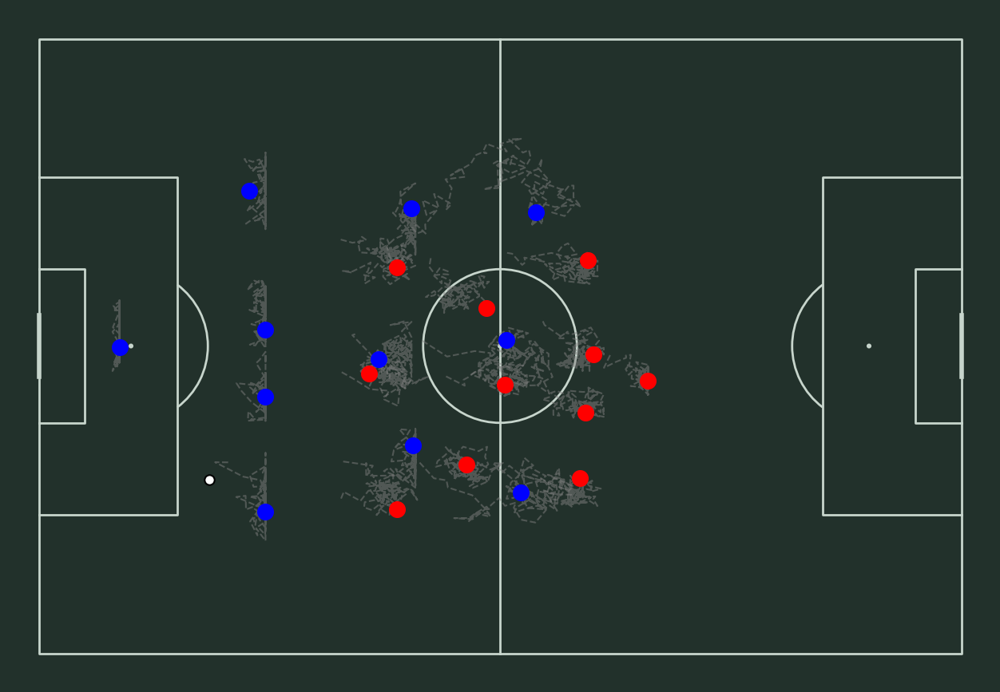

In [80]:
if __name__ == "__main__":

    main()